In [1]:
# This is an example snippet!
# To create your own, add a new snippet block to the
# snippets.json file in your jupyter data directory under nbextensions:
# $(jupyter --data-dir)/nbextensions/snippets/snippets.json
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import seawater
import os
%matplotlib notebook
import jmkfigure


deploy_name = 'dfo-bb046-20200717'
deploy_prefix = '/Users/jklymak/gliderdata/deployments/dfo-bb046/dfo-bb046-20200717/'
!mkdir figs
def get_timeseries(level='L0'):
    return xr.open_dataset(f'{deploy_prefix}/{level}-timeseries/{deploy_name}_{level}.nc')

def get_gridfile(level='L0'):
    return xr.open_dataset(f'{deploy_prefix}/{level}-gridfiles/{deploy_name}_grid.nc')

def write_gridfile(ds, level='L0'):
    try:
        os.mkdir(f'{deploy_prefix}/{level}-gridfiles/')
        print(f'Made {deploy_prefix}/{level}-gridfiles/')
    except:
        print(f'Failed to make {deploy_prefix}/{level}-gridfiles/')
        pass
    ds.to_netcdf(f'{deploy_prefix}/{level}-gridfiles/{deploy_name}_grid.nc')


Bad key "axes.color_cycle" on line 19 in
/Users/jklymak/.matplotlib/stylelib/ggplotjmk.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.2.1/matplotlibrc.template
or from the matplotlib source distribution


mkdir: figs: File exists


In [2]:
# This stuff defines an along-transet co-ordinate system:

lon0 = -129
lat0 =  51.5
def get_xy_lonlat(lon, lat, lon0, lat0):
    x = (lon - lon0) * np.cos(np.deg2rad(lat0)) * 60 * 1.852
    y = (lat - lat0) * 60 * 1.852
    return x, y

Waypoints={}
Waypoints['M5'] = {'lon': -128.0587, 'lat': 51.7271}
Waypoints['M6'] = {'lon': -128.1235, 'lat': 51.7139}
Waypoints['QCS01'] = {'lon': -128.2379, 'lat': 51.7076}
Waypoints['QCS02'] = {'lon': -128 - 17/60 - 34 /3600, 'lat': 51 + 41/60 + 39/3600}

Waypoints['SS5'] = {'lon': -128 - 30/60, 'lat': 51 + 28/60}
Waypoints['MPA1'] = {'lon': -128 - 43/60 -44 / 3600, 'lat': 51 + 23/60}
Waypoints['MPA2'] = {'lon': -129 - 55 / 3600, 'lat': 51 + 19/60 + 14 / 3600}
Waypoints['Shelf'] = {'lon': -129 - 49 /60 - 51 / 3600, 'lat': 51 + 5/60 + 13 / 3600}

wps = np.zeros((len(Waypoints.keys()), 2))
for nn, k in enumerate(Waypoints.keys()):
    print('k', k)
    wp = Waypoints[k]
    x, y  = get_xy_lonlat(wp['lon'], wp['lat'], lon0, lat0)
    wps[nn, 0] = x
    wps[nn, 1] = y
print(wps)


def get_xy(ds, lat0, lon0):
    x, y = get_xy_lonlat(ds.longitude, ds.latitude, lon0, lat0)
    ds['x'] = x
    ds.x.attrs['units'] = f'km east of {lon0} (local Cartesian projection)'
    ds['y'] = y
    ds.y.attrs['units'] = f'km north of {lat0} (local Cartesian projection)'
    return ds


def dist(x1,y1, x2,y2, x3,y3): # x3,y3 is the point
    px = x2-x1
    py = y2-y1

    dsq = px*px + py*py

    u =  ((x3 - x1) * px + (y3 - y1) * py) / dsq

    if u > 1:
        u = 1
    elif u < 0:
        u = 0

    x = x1 + u * px
    y = y1 + u * py

    dx = x - x3
    dy = y - y3

    dist = np.sqrt(dx*dx + dy*dy)

    return dist

def get_alongx(wps, x, y):

    distline = np.zeros(len(wps)-1)

    for j in range(0, len(wps)-1):
        distline[j] = np.sqrt((wps[j+1, 0] - wps[j, 0])**2 + (wps[j+1, 1] - wps[j, 1])**2)

    distline = np.hstack([0, np.cumsum(distline)])
    distline = distline - distline[2]

    ind = np.zeros(len(x))
    for j in range(len(x)):
        thedist = np.Inf
        for i in range(len(wps)-1):
            dd = dist(wps[i][0], wps[i][1], wps[i+1][0], wps[i+1][1], x[j], y[j])
            if dd < thedist:
                thedist = dd
                ind[j] = i

    alongx = x * 0.
    for i in range(len(x)):
        # get the distance along the line....
        indd = int(ind[i])
        x0 = wps[indd][0]
        x1 = wps[indd+1][0]
        y0 = wps[indd][1]
        y1 = wps[indd+1][1]

        xp = x[i] - x0
        yp = y[i] - y0
        dot = xp * (x1 - x0) + yp * (y1 - y0)
        dot = dot / np.sqrt((x1 - x0)**2 + (y1 - y0)**2)

        alongx[i] = dot + distline[indd]
    return alongx, ind, distline


k M5
k M6
k QCS01
k QCS02
k SS5
k MPA1
k MPA2
k Shelf
[[ 65.11332281  25.235352  ]
 [ 60.63085886  23.768568  ]
 [ 52.71737312  23.068512  ]
 [ 48.92126724  21.5758    ]
 [ 34.58691321  -3.704     ]
 [ 18.75379294 -12.964     ]
 [ -1.05682235 -19.93986667]
 [-57.47192079 -45.89873333]]


In [3]:
with get_gridfile(level='L2') as ds:
    ds = get_xy(ds, lat0, lon0)
    alongx, ind, distline = get_alongx(wps, ds.x.values, ds.y.values)
    print(alongx)
    ds['alongx'] = ('time', -alongx)
    ds.alongx.attrs['units'] = f'km along line defined by waypoints, QCS01 is origin, negative is to west.'
    ds.attrs['waypoints'] = str(Waypoints)
    ds.attrs['turn_indices'] = str([0, 377, 542, 731, len(ds.longitude)-1])
    write_gridfile(ds, level='L2geo')
    print('Wrote L2geo')

[ 4.41360049  4.40887955  4.41892213 ... 18.79465376 18.32306333
 17.80994315]
Failed to make /Users/jklymak/gliderdata/deployments/dfo-bb046/dfo-bb046-20200717//L2geo-gridfiles/
Wrote L2geo


In [81]:
!ls /Users/jklymak/gliderdata/deployments/dfo-bb046/dfo-bb046-20200717/L2geo-gridfiles/

dfo-bb046-20200717_grid.nc


<IPython.core.display.Javascript object>


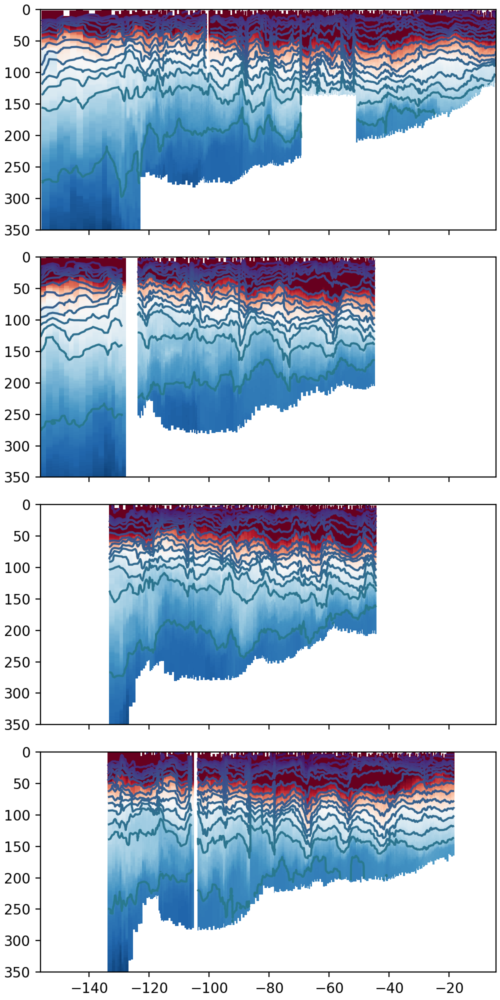

In [57]:
pdlevs = np.arange(22, 34, 0.25)
with get_gridfile(level='L2geo') as ds0:
    turns = eval(ds0.attrs['turn_indices'])
    
    fig, axs = plt.subplots(4, 1, sharex=True, sharey=True, constrained_layout=True, figsize=(5, 10))
    for ii in range(4):
        ax = axs[ii]
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        ds.temperature.values = ds.temperature.where(np.isfinite(ds.salinity)).values
        pc = ax.pcolormesh(ds.alongx, ds.depth, ds.temperature, vmin=5, vmax=10, cmap='RdBu_r')
        ax.contour(ds.alongx, ds.depth, ds.potential_density - 1000, pdlevs)
        ax.set_ylim([350, 0])

<xarray.Dataset>
Dimensions:                                 (depth: 1100, time: 1017)
Coordinates:
  * depth                                   (depth) float64 0.5 1.5 ... 1.1e+03
    profile                                 (time) float64 ...
  * time                                    (time) datetime64[ns] 2020-07-17T16:55:45.329613824 ... 2020-08-06T21:28:04.310509568
Data variables:
    longitude                               (time) float64 ...
    latitude                                (time) float64 ...
    profile_time_start                      (time) datetime64[ns] ...
    profile_time_end                        (time) datetime64[ns] ...
    heading                                 (depth, time) float64 ...
    pitch                                   (depth, time) float64 ...
    roll                                    (depth, time) float64 ...
    conductivity                            (depth, time) float64 ...
    temperature                             (depth, time) float64

<IPython.core.display.Javascript object>


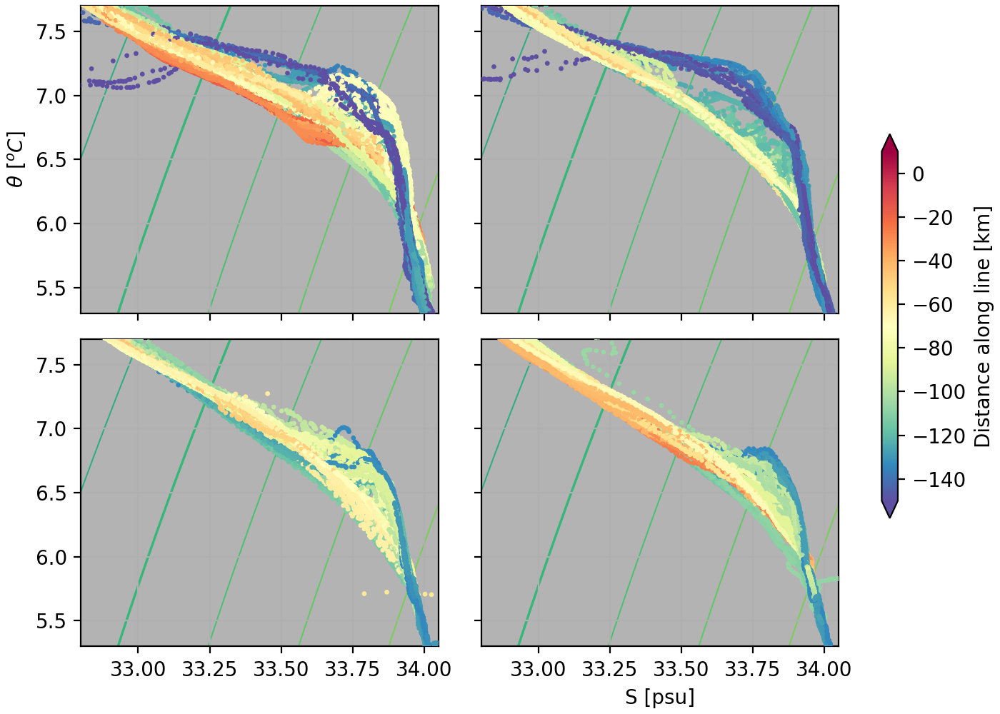

Figure(700x500)
Figure(700x500)


In [66]:
pdlevs = np.arange(22, 34, 0.5)
ss = np.arange(31, 34.5, 0.2)

tt = np.arange(4, 15, 0.2)
S, T = np.meshgrid(ss, tt)
pd = seawater.eos80.pden(S, T, 0*S, 0) - 1000 
pdlevs = np.arange(24, 28.1, 0.25)
with get_gridfile(level='L2detide') as ds0:
    print(ds0)
    turns = eval(ds0.attrs['turn_indices'])
    
    fig, axs = plt.subplots(2, 2, sharex=True, sharey=True, constrained_layout=True, figsize=(7, 5))
    for ii in range(4):
        ax = axs.flat[ii]
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        X = ds.alongx.values[np.newaxis, :] + 0 * ds.temperature
        ax.set_xlim(31, 34.5)
        ax.set_ylim([4, 15])


        ax.contour(ss, tt, pd, pdlevs, linewidths=0.7, zorder=1, vmin=22, vmax=28)

        cc = ax.contour(ss, tt, pd, pdlevs[::4], linewidths=1.2, zorder=1, 
                        vmin=22, vmax=28)
        ax.clabel(cc, fontsize=9, fmt='%1.0f')
        pc = ax.scatter(ds.salinity, ds.temperature, c=X, s=2, vmin=-150, vmax=10, 
                        cmap='Spectral_r', zorder=3, rasterized=True)
        ax.grid()
        
        if ii == 0:
            ax.set_ylabel('$\\theta\ [^oC]$')
        ax.set_facecolor('0.7')


    ax.set_xlabel('S [psu]')
    fig.colorbar(pc, ax=axs, shrink=0.6, extend='both', label='Distance along line [km]')
    jmkfigure.jmkprint('TSAll', 'PlotCalvert20200717.ipynb', dpi=200)
    
    ax.set_xlim(32.8, 34.05)
    ax.set_ylim([5.3, 7.7])
    jmkfigure.jmkprint('TSCanyon', 'PlotCalvert20200717.ipynb', dpi=200)
    

<IPython.core.display.Javascript object>


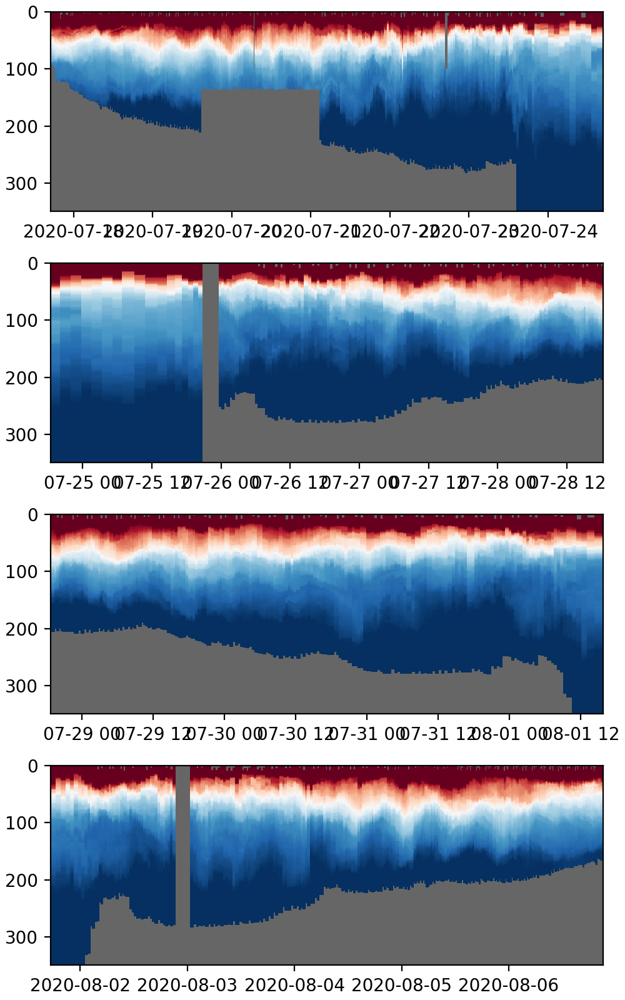

In [35]:
with get_gridfile(level='L2geo') as ds0:
    turns = eval(ds0.attrs['turn_indices'])
    fig, axs = plt.subplots(4, 1, sharex=False, sharey=True, constrained_layout=True, figsize=(5, 8))
    for ii in range(4):
        ax = axs[ii]
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        ds.temperature.values = ds.temperature.where(np.isfinite(ds.salinity)).values
        ax.pcolormesh(ds.time, ds.depth, ds.temperature, vmin=6, vmax=12, cmap='RdBu_r')
        ax.set_ylim([350, 0])
        ax.set_facecolor('0.4')

In [6]:

import scipy.signal as signal
import scipy.stats as stats

    
with get_gridfile(level='L2geo') as ds:
    Rmean = ds['potential_density'].mean(dim='time')
    
    means = xr.Dataset()
    
    Rmean = Rmean.sortby(Rmean, ascending=True).where(np.isfinite(Rmean), drop=True)

    Rbins = Rmean[::1]
    Rbins = np.hstack([1020, Rbins, 1027.4])

    with get_timeseries(level='L1') as ts:
        good = np.where(np.isfinite(ts.salinity + ts.potential_density + ts.temperature))[0]
        Smean, _, _ = stats.binned_statistic(ts.potential_density.values[good], 
                                             ts.salinity.values[good], statistic='mean', bins=Rbins)

        Tmean, _, _ = stats.binned_statistic(ts.potential_density.values[good], ts.temperature.values[good], 
                                             statistic='mean', bins=Rbins)


    sanom = ds.salinity - np.interp(ds.potential_density, Rbins[:-1] + np.diff(Rbins) / 2, Smean)
    tanom = ds.potential_temperature - np.interp(ds.potential_density, Rbins[:-1] + np.diff(Rbins) / 2, Tmean)
    #sanom = sanom.fillna(0)
    




/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


<IPython.core.display.Javascript object>


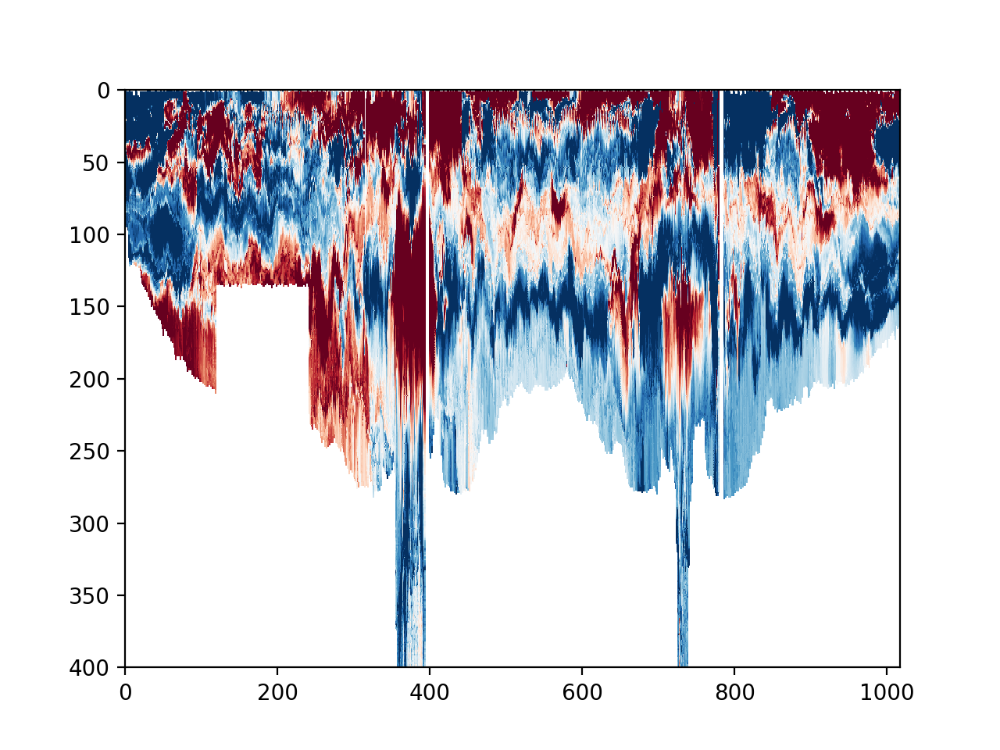

(400.0, 0.0)

In [7]:
fig, ax = plt.subplots()
ax.pcolormesh(tanom, cmap='RdBu_r', vmin=-0.1, vmax=0.1)
ax.set_ylim(400, 0)

<IPython.core.display.Javascript object>


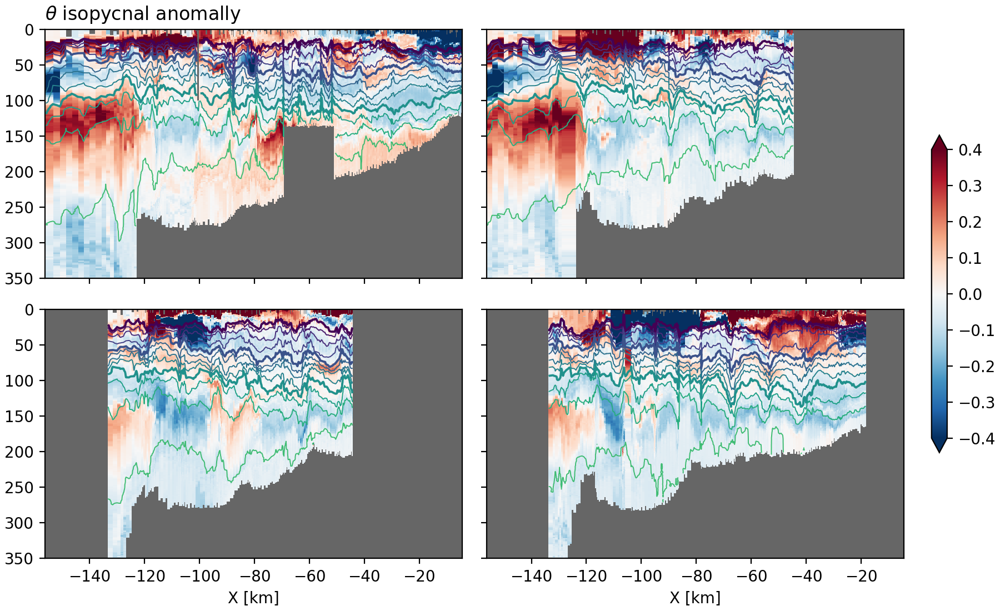

/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


Figure(900x550)


In [18]:
pdlevs = np.arange(24, 28.1, 0.25)
with get_gridfile(level='L2geo') as ds0:
    ds0['tanom'] = tanom
    turns = eval(ds0.attrs['turn_indices'])
    
    fig, axs = plt.subplots(2, 2, sharex=True, sharey=True, constrained_layout=True, figsize=(9, 5.5))
    for ii in range(4):
        ax = axs.flat[ii]
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        sel = np.where(np.isfinite(ds.salinity.mean(dim='depth')))[0]
        ds = ds.isel(time=sel)
        
        ds.temperature.values = ds.temperature.where(np.isfinite(ds.salinity)).values
        pc = ax.pcolormesh(ds.alongx, ds.depth, ds.tanom, vmin=-0.4, 
                           vmax=0.4, cmap='RdBu_r', rasterized=True)
        ax.contour(ds.alongx, ds.depth, ds.potential_density - 1000, pdlevs, vmin=24, linewidths=0.7)
        cc = ax.contour(ds.alongx, ds.depth, ds.potential_density - 1000, pdlevs[::4], vmin=24, linewidths=1.4)
        ax.set_ylim([350, 0])
        ax.set_facecolor('0.4')
        if ii>1:
            ax.set_xlabel('X [km]')
            
    fig.colorbar(pc, ax=axs, shrink=0.6, extend='both')
    axs[0, 0].set_title('$\\theta$ isopycnal anomally', loc='left')
    
    jmkfigure.jmkprint('TempAnom', 'PlotCalvert20200717', dpi=200)

TempAnom.pdf TempAnom.png TempAnom.svg TempAnom.tex


## Isopycnal frame?

Want to get in isopycnals, smooth the depths of isopycnals by 24 h or so, and then remap into physical space.  

/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


<IPython.core.display.Javascript object>


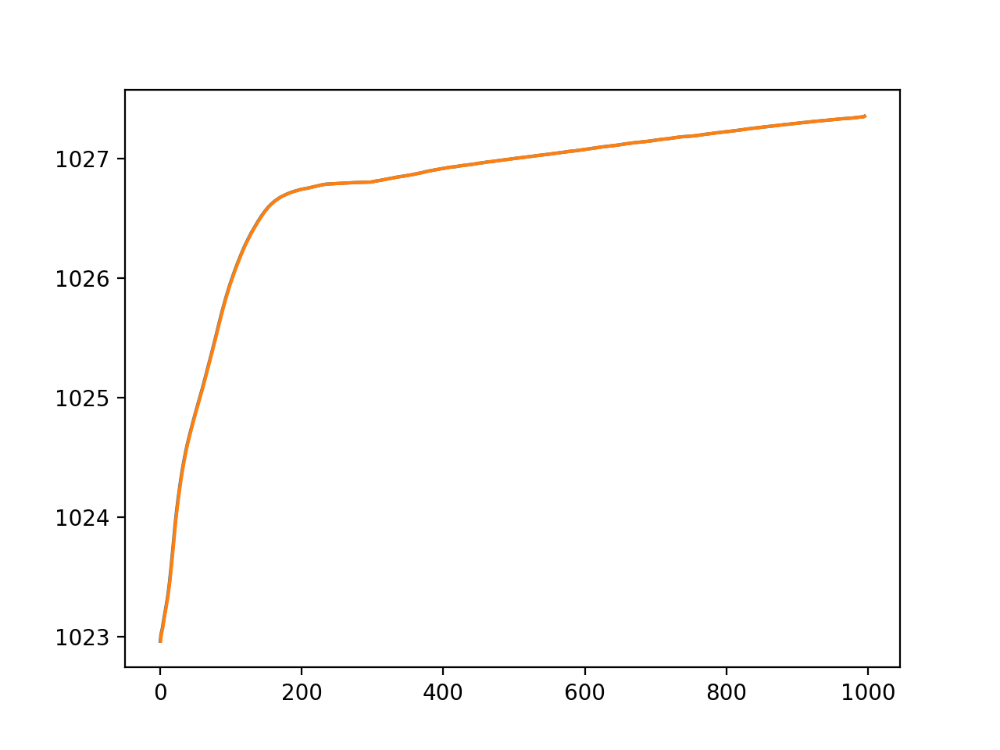

1100


In [198]:
with get_gridfile(level='L2geo') as ds0:
    pdmean = np.sort(ds0.potential_density.mean(dim='time'))
    fig, ax = plt.subplots()
    ax.plot(np.sort(pdmean))
    depth = ds0.depth
print(len(pdmean))
pdmean = np.interp(np.arange(0, 1100, 0.1), np.arange(0, 1100), pdmean)

depth = np.interp(np.arange(0, 1100, 0.1), np.arange(0, 1100), depth)

depth = depth[np.isfinite(pdmean)]

pdmean = pdmean[np.isfinite(pdmean)]


ax.plot(depth, pdmean)

In [209]:
## depth map:


with get_gridfile('L2geo') as ds0:

    iso = xr.Dataset(coords={'time': ds0.time, 'potential_density': pdmean[np.isfinite(pdmean)]})
    # get the depth...
    
    iso['isopycnal_depth'] = (('potential_density', 'time'), np.NaN * np.zeros((len(iso.potential_density), len(iso.time))))

    fields = ['potential_temperature', 'salinity', 'chlorophyll', 'cdom', 'backscatter_700', 'oxygen_concentration']
    for field in fields:
        iso[field] = (('potential_density', 'time'), np.NaN * np.zeros((len(iso.potential_density), len(iso.time))))

    for ii in range(len(iso.time)):
        good = np.where(np.isfinite(ds0.potential_density[:, ii]))[0]
        if len(good) > 2:
            iso.isopycnal_depth[:, ii] = np.interp(iso.potential_density, ds0.potential_density[good, ii], 
                                               ds0.depth[good], left=np.NaN, right=np.NaN)
            for field in fields:
                iso[field][:, ii] = np.interp(iso.potential_density, ds0.potential_density[good, ii], 
                                               ds0[field][good, ii], left=np.NaN, right=np.NaN)


In [220]:
iso['potential_temperature_anomally'] = iso.potential_temperature - iso.potential_temperature.mean(dim='time')

<IPython.core.display.Javascript object>


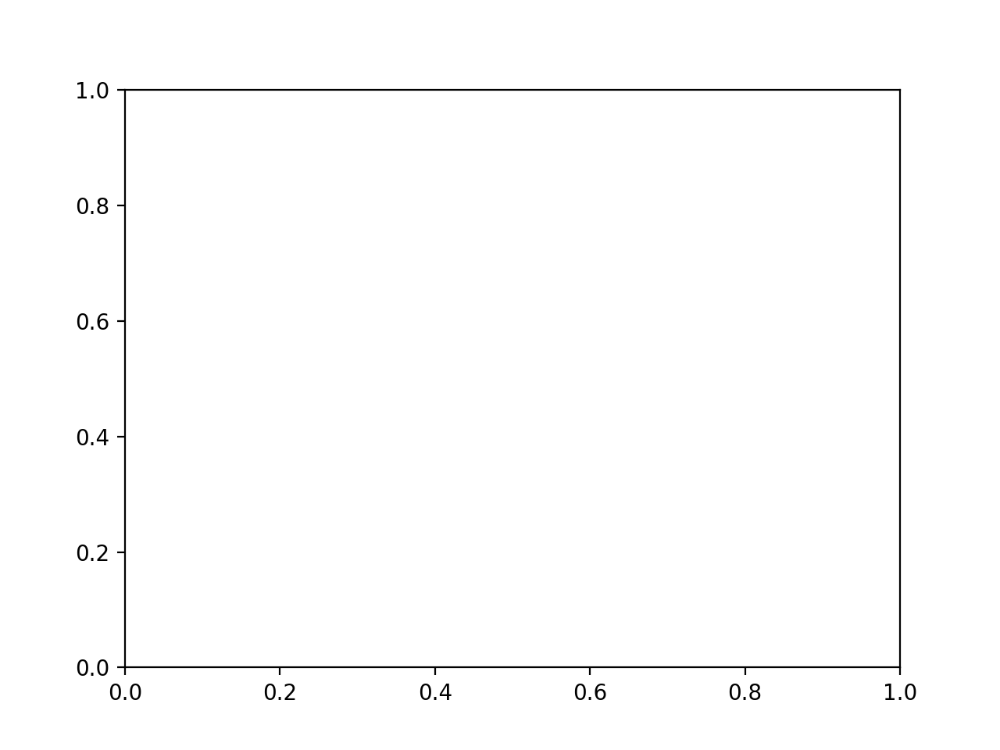

In [210]:
fig, ax = plt.subplots()
dsm = iso.isopycnal_depth * 1.0


for ind in range(len(iso.potential_density)):
    good = np.where(np.isfinite(iso.isopycnal_depth[ind, :]))[0]
    if len(good) > 30:
        dsm[ind, good] = np.convolve(iso.isopycnal_depth[ind, good], np.ones((30))/30, 'same')
        dsm[ind, good[:15]] = iso.isopycnal_depth[ind, good[:15]]

        dsm[ind, good[-15:]] = iso.isopycnal_depth[ind, good[-15:]]

iso['smooth_depth'] = dsm


<IPython.core.display.Javascript object>


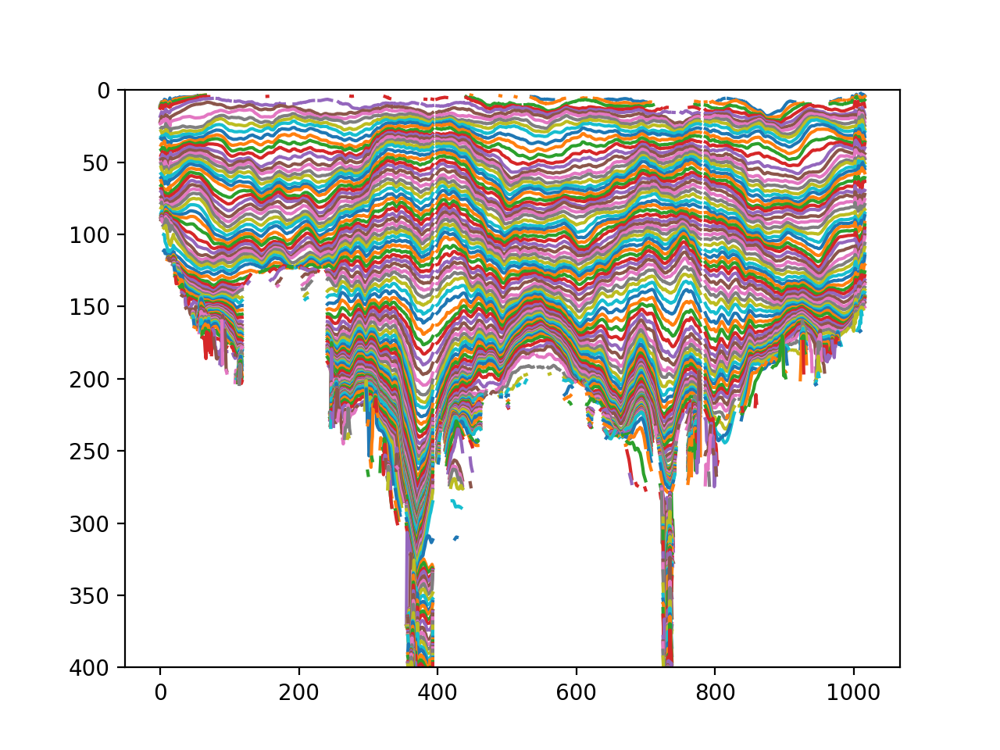

(400.0, 0.0)

In [211]:
fig, ax = plt.subplots()
ax.plot(iso.smooth_depth[::30, :].T)
ax.set_ylim(400, 0)

In [237]:
# now map temperature to the smooth depths...
print(iso)
fields = ['potential_temperature', 'salinity', 'chlorophyll', 'cdom', 'backscatter_700', 'oxygen_concentration']
    
fields = fields + ['potential_temperature_anomally']
with get_gridfile('L2geo') as ds:
    for field in fields:
        ds[field+'_detided'] = ds.potential_temperature * np.NaN
    
    ds['potential_density_detided'] = ds.potential_temperature * np.NaN
    for ii in range(len(iso.time)):
        for field in fields:
            good = np.where(np.isfinite(iso.smooth_depth[:, ii] + iso[field][:, ii]))[0]
            if len(good) > 2:

                ds[field+'_detided'][:, ii] = np.interp(ds.depth, iso.smooth_depth[good, ii], 
                                                        iso[field][good, ii], left=np.NaN, right=np.NaN)
        good = np.where(np.isfinite(iso.smooth_depth[:, ii]))[0]
        if len(good) > 2:
            ds['potential_density_detided'][:, ii] = np.interp(ds.depth, iso.smooth_depth[good, ii], 
                                                               iso.potential_density[good], left=np.NaN, 
                                                               right=np.NaN)
    write_gridfile(ds, level='L2detide')

<xarray.Dataset>
Dimensions:                         (potential_density: 9951, time: 1017)
Coordinates:
    profile                         (time) float64 ...
  * time                            (time) datetime64[ns] 2020-07-17T16:55:45.329613824 ... 2020-08-06T21:28:04.310509568
  * potential_density               (potential_density) float64 1.023e+03 ... 1.027e+03
Data variables:
    isopycnal_depth                 (potential_density, time) float64 10.41 ... nan
    potential_temperature           (potential_density, time) float64 13.6 ... nan
    salinity                        (potential_density, time) float64 30.72 ... nan
    chlorophyll                     (potential_density, time) float64 1.354 ... nan
    cdom                            (potential_density, time) float64 1.912 ... nan
    backscatter_700                 (potential_density, time) float64 0.0004605 ... nan
    oxygen_concentration            (potential_density, time) float64 323.0 ... nan
    smooth_depth        

In [239]:
print(ds)

<xarray.Dataset>
Dimensions:                                 (depth: 1100, time: 1017)
Coordinates:
  * depth                                   (depth) float64 0.5 1.5 ... 1.1e+03
    profile                                 (time) float64 ...
  * time                                    (time) datetime64[ns] 2020-07-17T16:55:45.329613824 ... 2020-08-06T21:28:04.310509568
Data variables:
    longitude                               (time) float64 ...
    latitude                                (time) float64 ...
    profile_time_start                      (time) datetime64[ns] ...
    profile_time_end                        (time) datetime64[ns] ...
    heading                                 (depth, time) float64 ...
    pitch                                   (depth, time) float64 ...
    roll                                    (depth, time) float64 ...
    conductivity                            (depth, time) float64 ...
    temperature                             (depth, time) float64

<xarray.Dataset>
Dimensions:                                 (depth: 1100, time: 1017)
Coordinates:
  * depth                                   (depth) float64 0.5 1.5 ... 1.1e+03
    profile                                 (time) float64 ...
  * time                                    (time) datetime64[ns] 2020-07-17T16:55:45.329613824 ... 2020-08-06T21:28:04.310509568
Data variables:
    longitude                               (time) float64 ...
    latitude                                (time) float64 ...
    profile_time_start                      (time) datetime64[ns] ...
    profile_time_end                        (time) datetime64[ns] ...
    heading                                 (depth, time) float64 ...
    pitch                                   (depth, time) float64 ...
    roll                                    (depth, time) float64 ...
    conductivity                            (depth, time) float64 ...
    temperature                             (depth, time) float64

<IPython.core.display.Javascript object>


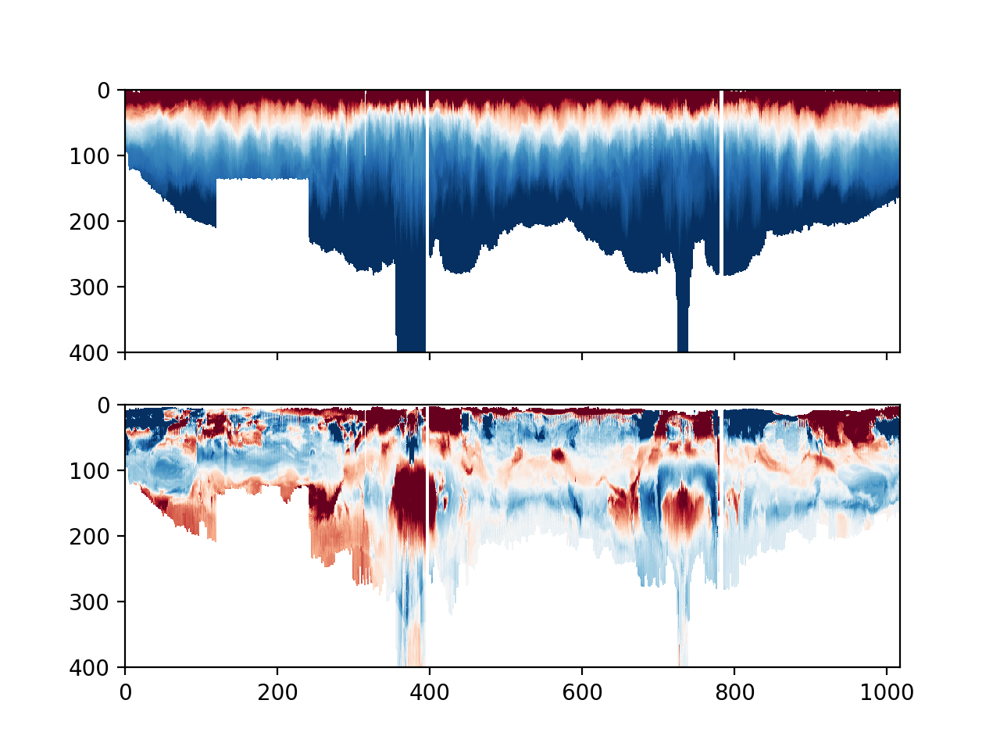

(400.0, 0.0)

In [232]:
print(ds)
fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
ax = axs[0]
ax.pcolormesh(ds.potential_temperature, cmap='RdBu_r', vmin=6, vmax=13)
ax.set_ylim(400, 0)
ax = axs[1]
ax.pcolormesh(ds.potential_temperature_anomally_detided, cmap='RdBu_r', vmin=-0.2, vmax=0.2)
ax.set_ylim(400, 0)

<IPython.core.display.Javascript object>


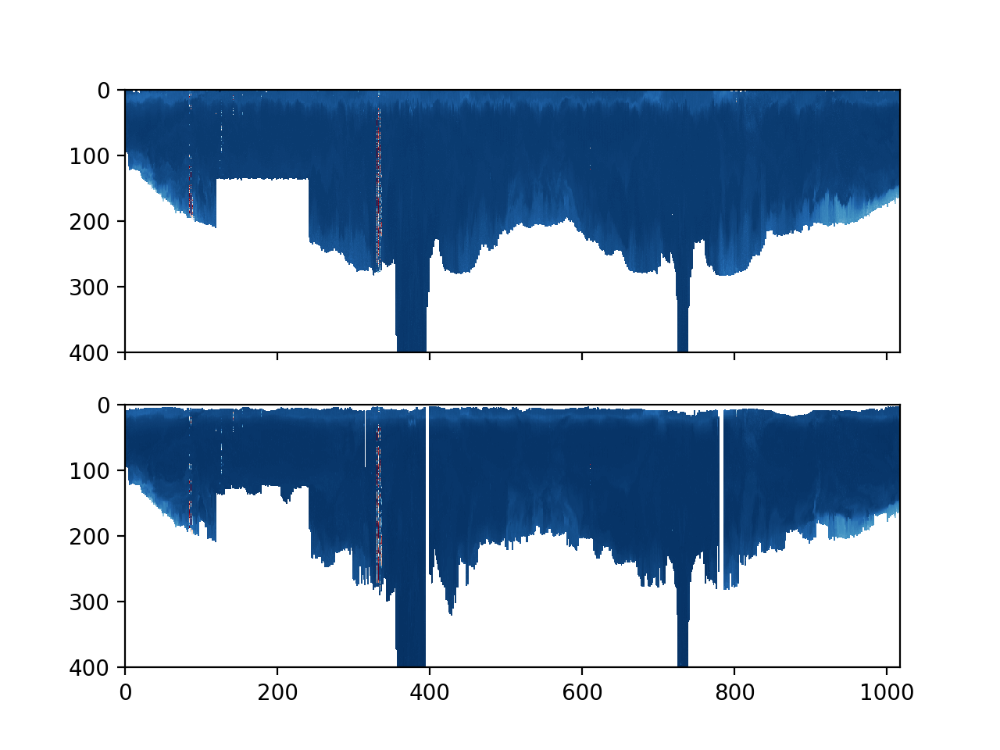

(400.0, 0.0)

In [218]:
fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
ax = axs[0]
ax.pcolormesh(ds.backscatter_700, cmap='RdBu_r')
ax.set_ylim(400, 0)
ax = axs[1]
ax.pcolormesh(ds.backscatter_700_detided, cmap='RdBu_r')
ax.set_ylim(400, 0)

<IPython.core.display.Javascript object>


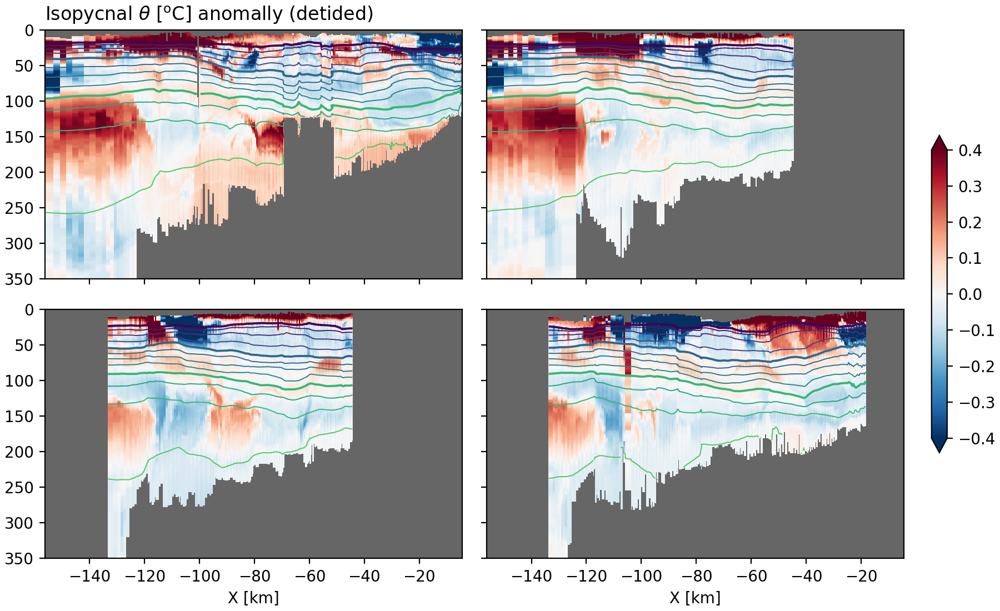

/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


Figure(900x550)


In [22]:
pdlevs = np.arange(24, 28, 0.25)
with get_gridfile(level='L2detide') as ds0:
    turns = eval(ds0.attrs['turn_indices'])
    
    fig, axs = plt.subplots(2, 2, sharex=True, sharey=True, constrained_layout=True, figsize=(9, 5.5))
    for ii in range(4):
        ax = axs.flat[ii]
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        sel = np.where(np.isfinite(ds.salinity_detided.mean(dim='depth')))[0]
        ds = ds.isel(time=sel)
        #ds.temperature.values = ds.temperature.where(np.isfinite(ds.salinity)).values
        pc = ax.pcolormesh(ds.alongx, ds.depth, ds.potential_temperature_anomally_detided, 
                           rasterized=True, vmin=-0.4, vmax=0.4, cmap='RdBu_r')
        ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs, vmin=24, linewidths=0.7)
        cc = ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs[::4], vmin=24, linewidths=1.4)
        
        ax.set_ylim([350, 0])
        ax.set_facecolor('0.4')
        if ii>1:
            ax.set_xlabel('X [km]')
    fig.colorbar(pc, ax=axs, shrink=0.6, extend='both', )
    axs[0, 0].set_title('Isopycnal $\\theta\ \mathrm{[^oC]}$ anomally (detided)', loc='left')
    
    fig.savefig('figs/TempAnomDetide.pdf', dpi=200)
    jmkfigure.jmkprint('TempAnomDetide', 'PlotCavert20200717.ipynb', dpi=200)

<IPython.core.display.Javascript object>


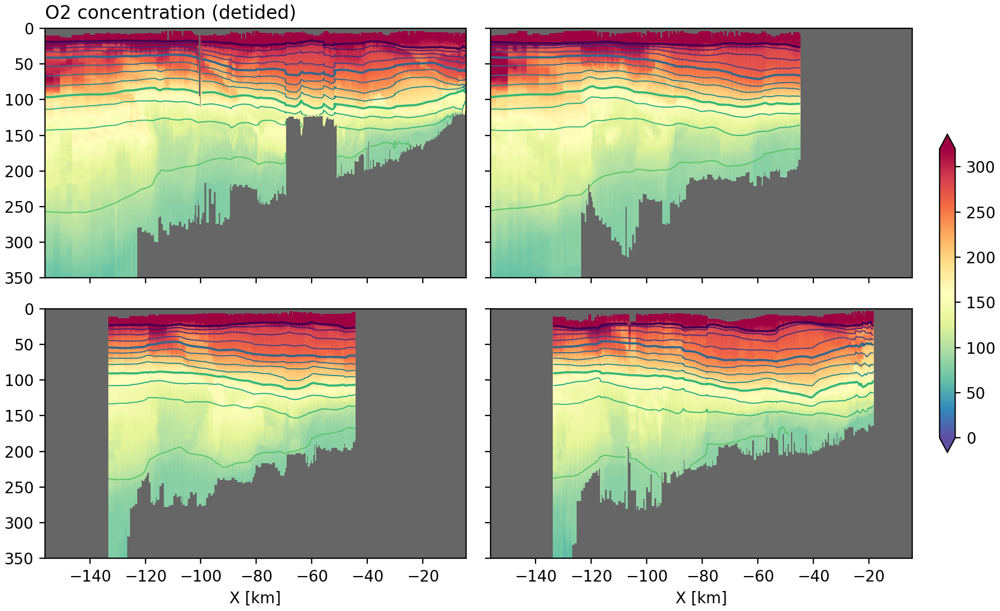

/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


Figure(900x550)


In [24]:
pdlevs = np.arange(24, 28, 0.25)
with get_gridfile(level='L2detide') as ds0:
    turns = eval(ds0.attrs['turn_indices'])
    
    fig, axs = plt.subplots(2, 2, sharex=True, sharey=True, constrained_layout=True, figsize=(9, 5.5))
    for ii in range(4):
        ax = axs.flat[ii]
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        sel = np.where(np.isfinite(ds.salinity_detided.mean(dim='depth')))[0]
        ds = ds.isel(time=sel)
        #ds.temperature.values = ds.temperature.where(np.isfinite(ds.salinity)).values
        pc = ax.pcolormesh(ds.alongx, ds.depth, ds.oxygen_concentration_detided,cmap='Spectral_r', 
                           vmin=0, vmax=320, rasterized=True)
        ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs, vmin=24, linewidths=0.7)
        cc = ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs[::4], vmin=24, linewidths=1.4)
        
        ax.set_ylim([350, 0])
        ax.set_facecolor('0.4')
        if ii>1:
            ax.set_xlabel('X [km]')
    fig.colorbar(pc, ax=axs, shrink=0.6, extend='both', )
    axs[0, 0].set_title('O2 concentration (detided)', loc='left')
    jmkfigure.jmkprint('O2Detide', 'PlotCavert20200717.ipynb', dpi=200)

In [294]:
!open figs/TempAnomDetide.pdf -a Preview

<IPython.core.display.Javascript object>


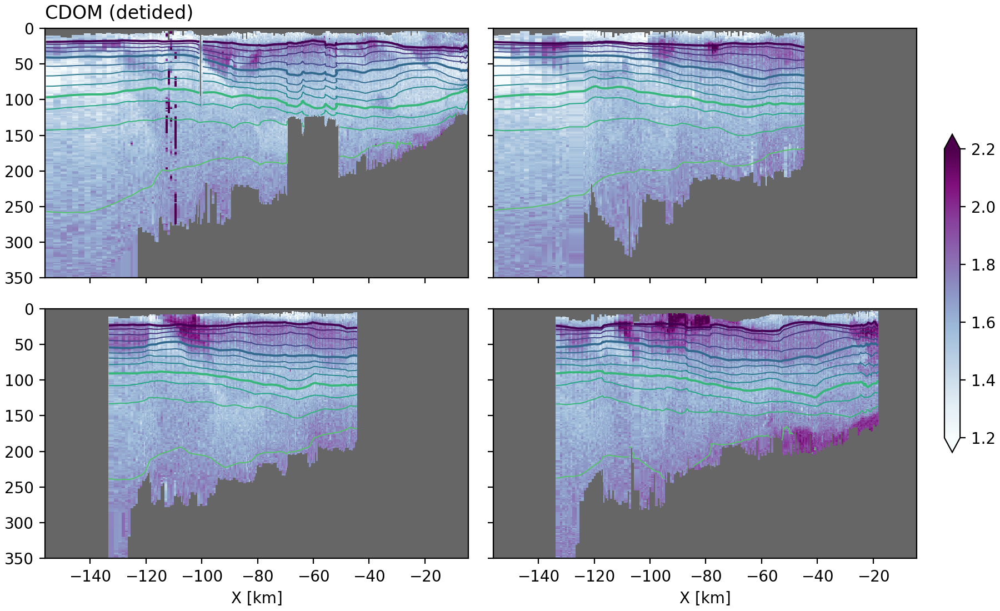

/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


Figure(900x550)


In [42]:
pdlevs = np.arange(24, 28, 0.25)
with get_gridfile(level='L2detide') as ds0:
    turns = eval(ds0.attrs['turn_indices'])
    
    fig, axs = plt.subplots(2, 2, sharex=True, sharey=True, constrained_layout=True, figsize=(9, 5.5))
    for ii in range(4):
        ax = axs.flat[ii]
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        sel = np.where(np.isfinite(ds.salinity_detided.mean(dim='depth')))[0]
        ds = ds.isel(time=sel)
       
        #ds.temperature.values = ds.temperature.where(np.isfinite(ds.salinity)).values
        pc = ax.pcolormesh(ds.alongx, ds.depth, ds.cdom_detided,cmap='BuPu', vmin=1.2, vmax=2.2, rasterized=True)
        ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs, vmin=24, linewidths=0.7)
        cc = ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs[::4], vmin=24, linewidths=1.4)
        
        ax.set_ylim([350, 0])
        ax.set_facecolor('0.4')
        if ii>1:
            ax.set_xlabel('X [km]')
    fig.colorbar(pc, ax=axs, shrink=0.6, extend='both', )
    axs[0, 0].set_title('CDOM (detided)', loc='left')
    jmkfigure.jmkprint('CDOMDetide', 'PlotCavert20200717.ipynb', dpi=200)

<IPython.core.display.Javascript object>


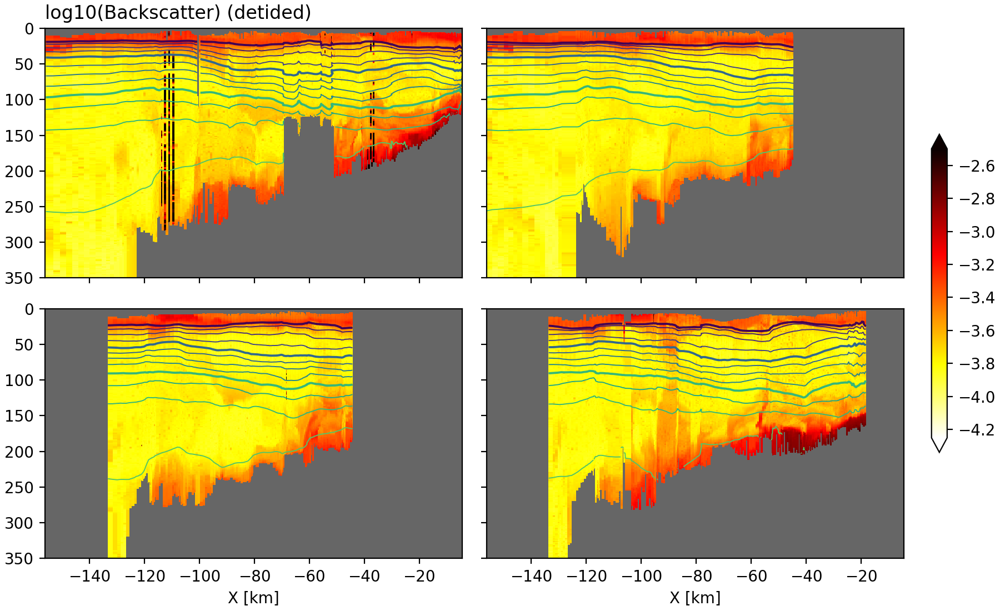

/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


Figure(900x550)


In [41]:
pdlevs = np.arange(24, 28, 0.25)
with get_gridfile(level='L2detide') as ds0:
    turns = eval(ds0.attrs['turn_indices'])
    
    fig, axs = plt.subplots(2, 2, sharex=True, sharey=True, constrained_layout=True, figsize=(9, 5.5))
    for ii in range(4):
        ax = axs.flat[ii]
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        sel = np.where(np.isfinite(ds.salinity_detided.mean(dim='depth')))[0]
        ds = ds.isel(time=sel)
       
        #ds.temperature.values = ds.temperature.where(np.isfinite(ds.salinity)).values
        pc = ax.pcolormesh(ds.alongx, ds.depth, np.log10(ds.backscatter_700_detided),cmap='hot_r', 
                           vmin=-4.25, vmax=-2.5, rasterized=True)
        ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs, vmin=24, linewidths=0.7)
        cc = ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs[::4], vmin=24, linewidths=1.4)
        
        ax.set_ylim([350, 0])
        ax.set_facecolor('0.4')
        if ii>1:
            ax.set_xlabel('X [km]')
    fig.colorbar(pc, ax=axs, shrink=0.6, extend='both', )
    axs[0, 0].set_title('log10(Backscatter) (detided)', loc='left')
    jmkfigure.jmkprint('BackscatterDetide', 'PlotCavert20200717.ipynb', dpi=200)

<IPython.core.display.Javascript object>


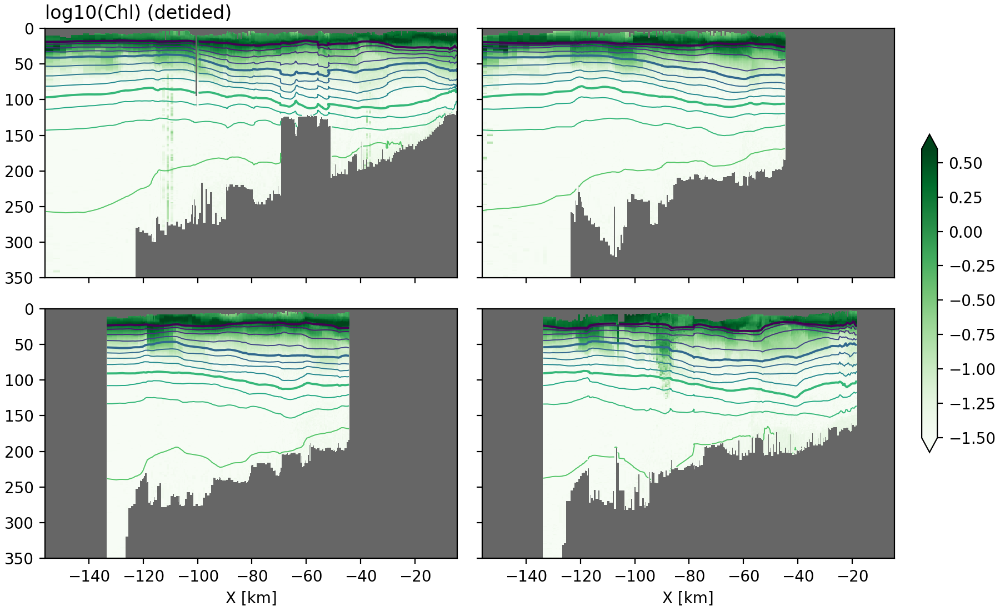

/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


Figure(900x550)


In [47]:
pdlevs = np.arange(24, 28, 0.25)
with get_gridfile(level='L2detide') as ds0:
    turns = eval(ds0.attrs['turn_indices'])
    
    fig, axs = plt.subplots(2, 2, sharex=True, sharey=True, constrained_layout=True, figsize=(9, 5.5))
    for ii in range(4):
        ax = axs.flat[ii]
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        sel = np.where(np.isfinite(ds.salinity_detided.mean(dim='depth')))[0]
        ds = ds.isel(time=sel)
       
        #ds.temperature.values = ds.temperature.where(np.isfinite(ds.salinity)).values
        pc = ax.pcolormesh(ds.alongx, ds.depth, np.log10(ds.chlorophyll_detided),cmap='Greens', 
                           rasterized=True, vmin=-1.5, vmax=0.6)
        ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs, vmin=24, linewidths=0.7)
        cc = ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs[::4], vmin=24, linewidths=1.4)
        
        ax.set_ylim([350, 0])
        ax.set_facecolor('0.4')
        if ii>1:
            ax.set_xlabel('X [km]')
    fig.colorbar(pc, ax=axs, shrink=0.6, extend='both', )
    axs[0, 0].set_title('log10(Chl) (detided)', loc='left')
    jmkfigure.jmkprint('ChlDetide', 'PlotCavert20200717.ipynb', dpi=200)

<IPython.core.display.Javascript object>


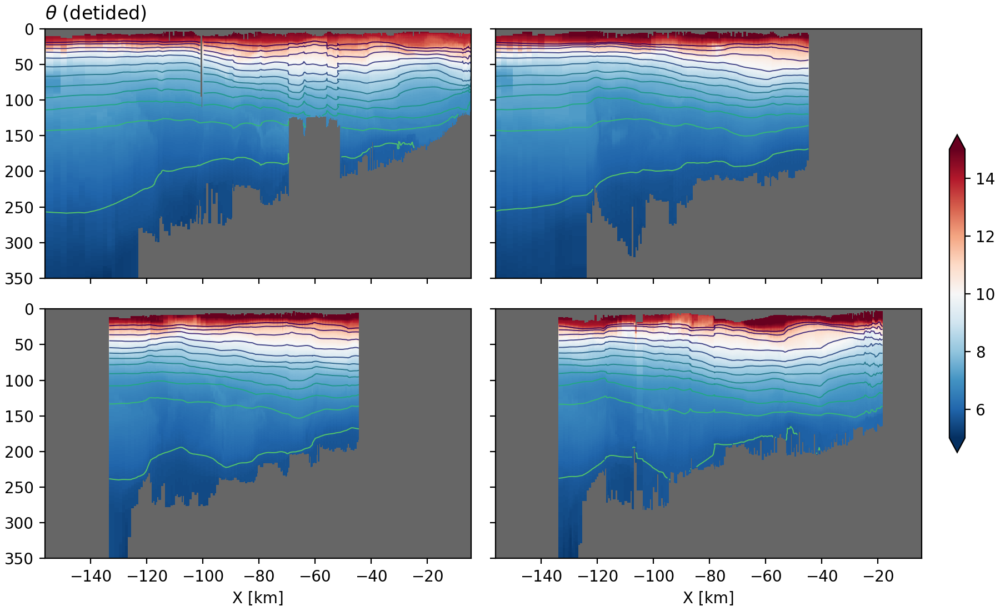

/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


In [281]:
pdlevs = np.arange(24, 28, 0.25)
with get_gridfile(level='L2detide') as ds0:
    turns = eval(ds0.attrs['turn_indices'])
    
    fig, axs = plt.subplots(2, 2, sharex=True, sharey=True, constrained_layout=True, figsize=(9, 5.5))
    for ii in range(4):
        ax = axs.flat[ii]
        
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        sel = np.where(np.isfinite(ds.salinity_detided.mean(dim='depth')))[0]
        ds = ds.isel(time=sel)
        pc = ax.pcolormesh(ds.alongx, ds.depth, ds.potential_temperature_detided,cmap='RdBu_r', vmin=5, vmax=15, 
                          rasterized=True)
        ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs, vmin=24, linewidths=0.7)
        ax.set_ylim([350, 0])
        ax.set_facecolor('0.4')
        if ii>1:
            ax.set_xlabel('X [km]')
    fig.colorbar(pc, ax=axs, shrink=0.6, extend='both', )
    axs[0, 0].set_title('$\\theta$ (detided)', loc='left')
    
    

<IPython.core.display.Javascript object>


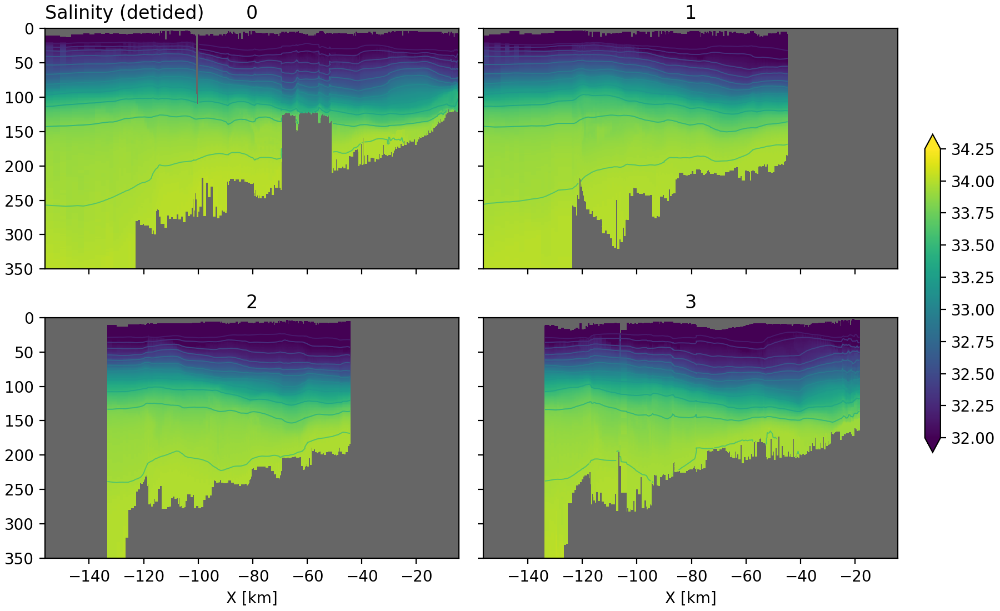

/Users/jklymak/anaconda3/envs/glider_analysis/lib/python3.8/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


In [280]:
pdlevs = np.arange(24, 28, 0.25)
with get_gridfile(level='L2detide') as ds0:
    turns = eval(ds0.attrs['turn_indices'])
    
    fig, axs = plt.subplots(2, 2, sharex=True, sharey=True, constrained_layout=True, figsize=(9, 5.5))
    for ii in range(4):
        ax = axs.flat[ii]
        ds = ds0.isel(time=range(turns[ii], turns[ii+1]))
        sel = np.where(np.isfinite(ds.salinity_detided.mean(dim='depth')))[0]
        ds = ds.isel(time=sel)
        pc = ax.pcolormesh(ds.alongx, ds.depth, ds.salinity_detided,cmap='viridis', vmin=32, vmax=34.25)
        ax.contour(ds.alongx, ds.depth, ds.potential_density_detided - 1000, pdlevs, vmin=24, linewidths=0.7)
        ax.set_ylim([350, 0])
        ax.set_facecolor('0.4')
        ax.set_title(ii)
        if ii>1:
            ax.set_xlabel('X [km]')
    fig.colorbar(pc, ax=axs, shrink=0.6, extend='both', )
    axs[0, 0].set_title('Salinity (detided)', loc='left')

In [43]:
print(ds)

<xarray.Dataset>
Dimensions:                                 (depth: 1100, time: 279)
Coordinates:
  * depth                                   (depth) float64 0.5 1.5 ... 1.1e+03
    profile                                 (time) float64 ...
  * time                                    (time) datetime64[ns] 2020-08-01T17:19:15.495044352 ... 2020-08-06T21:05:30.344085504
Data variables:
    longitude                               (time) float64 ...
    latitude                                (time) float64 ...
    profile_time_start                      (time) datetime64[ns] ...
    profile_time_end                        (time) datetime64[ns] ...
    heading                                 (depth, time) float64 ...
    pitch                                   (depth, time) float64 ...
    roll                                    (depth, time) float64 ...
    conductivity                            (depth, time) float64 ...
    temperature                             (depth, time) float64 